In [ ]:
import os
os.system('pip install opencv-python numpy pandas tqdm matplotlib')
os.system('pip install scipy scikit-learn scikit-image requests rasterfairy pillow')

# Imports

In [23]:
import cv2
import numpy as np
import rasterfairy
import requests

from PIL import Image
from skimage.feature import local_binary_pattern
from sklearn.manifold import TSNE
from scipy.stats import skew, kurtosis

from utils.utils import *
from utils.texture import *

# Functions

# Global variables

In [19]:
image_url = 'http://historic-cities.huji.ac.il/yemen/al_mukha/maps/bellin_1764_III_20_b.jpg'
LBP_radius = 3
patch_size = 50

# Script

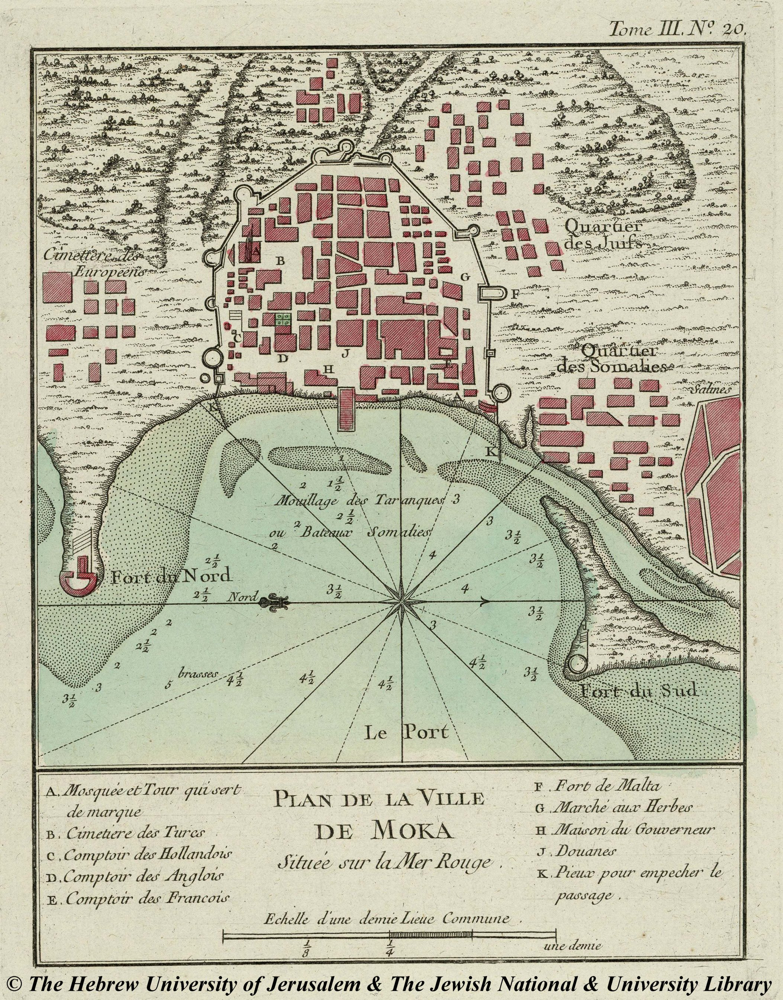

In [16]:
# Load image from URL
image_pil = Image.open(requests.get(image_url, stream=True).raw)
image_pil

In [44]:
# Cut image into patches
img = np.asarray(image_pil, dtype='uint8')
img = img[:img.shape[0]-img.shape[0]%patch_size, :img.shape[1]-img.shape[1]%patch_size]
image = img.reshape((img.shape[0]//patch_size, patch_size, img.shape[1]//patch_size, patch_size, 3))

# Iterate over patches
patches, features = [], []
for i in range(img.shape[0]//patch_size):
    for j in range(img.shape[1]//patch_size):
        patch = image[i, :, j]
        
        # When the patch is not totally black, compute the figurative features
        if np.min(np.sum(patch, axis=2)) > 0:

            hog = getHOGdescriptors(patch)
            hog = np.concatenate((np.asarray([hog[:,0]]).T, np.asarray([hog[:,12]]).T, 
                            np.asarray([hog[:,6]+hog[:,18]]).T, 
                            np.asarray([hog[:,4]+hog[:,8]+hog[:,16]+hog[:,22]]).T, np.asarray(
                [hog[:,1]+hog[:,2]+hog[:,3]+hog[:,5]+hog[:,7]+hog[:,9]+hog[:,10]+hog[:,11]+hog[:,13]+\
                 hog[:,14]+hog[:,15]+hog[:,17]+hog[:,19]+hog[:,21]+hog[:,22]+hog[:,23]]).T), axis=1)

            feat = np.concatenate([getColorDescriptors(patch), getLBPdescriptors(patch), hog], axis=-1)
            features.append(feat[0])
            patches.append(patch)

In [60]:
# Project the patches with tSNE
tf = TSNE(n_components=2, random_state=0).fit_transform(features)

# Constrain the projected points to a grid
grid, grid_shape = rasterfairy.transformPointCloud2D(tf)
grid = grid.astype('int')

# Draw the patches corresponding to the projected points on the canvas
canvas = np.zeros((grid_shape[0]*patch_size, grid_shape[1]*patch_size, 3))
for (x, y), patch in zip(grid, patches):
    canvas[x*patch_size:(x+1)*patch_size, y*patch_size:(y+1)*patch_size] = patch
canvas = (canvas).astype('uint8')

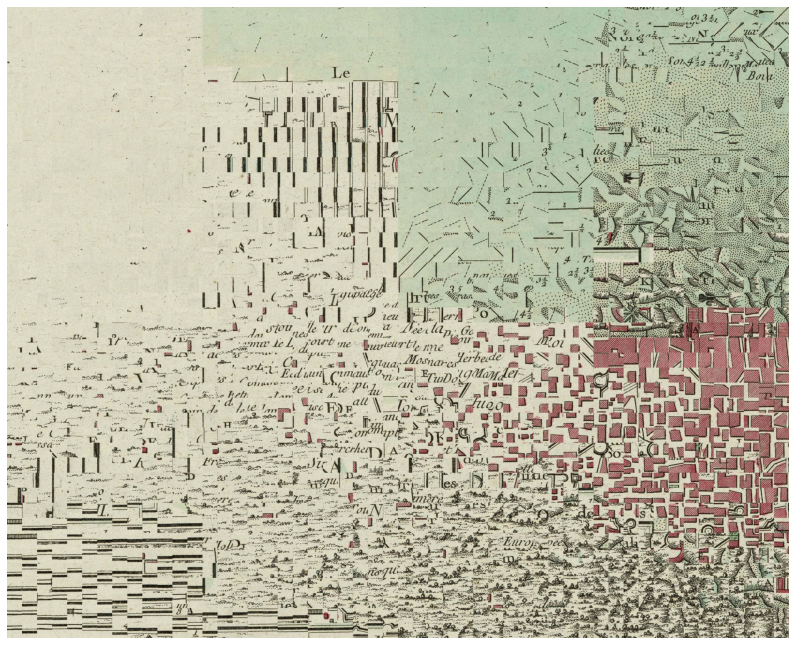

In [61]:
# Visualize result
imageShow(canvas);